# Water Quality Prediction System (Rwanda Chapter)

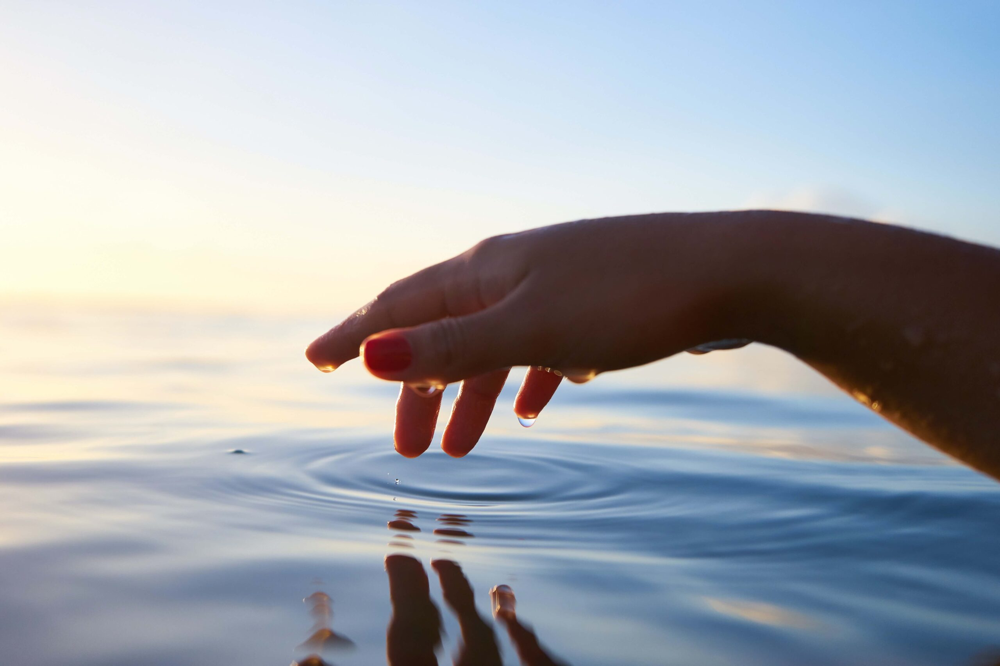

### Life Cycle or machine learning project

* Research previous work and Data Collection
* Data Collection
* Exploratory Data Analysis
* Preprocessing and feature engineering
* Model Development
* Model Training
* Model Analysis and Interpretation
* App Development


## 1.) Project Problem Statement

* Access to clean water is a critical challenge in many parts of the world, including Rwanda. Water quality prediction is important for ensuring the availability of safe and clean water for drinking, agriculture, and other purposes.
* However, traditional methods for water quality prediction are often time-consuming and costly, and they may not provide accurate and timely information. 
* To address this challenge, the Omdena Rwanda Chapter has initiated a project to develop an automated water quality prediction system using machine learning.

## 2.) Data Collection

* Data Source: https://drive.google.com/drive/folders/1_KJ09bHckVYVG_2ZHbRHIDCVtM04wpZI?usp=sharing
* The data consists of 18 columns and 10001 rows. 

## 2.1 Import Data and Required Libraries

#### NumPy, Pandas, Matplotlib, Seaborn, Warings and scikit learn Library 

In [40]:
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt 
%matplotlib inline
plt.style.use('ggplot')
import missingno as mno
from sklearn.model_selection import train_test_split
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

## Import the CSV Data as Pandas DataFrame

In [41]:
df = pd.read_csv("C:/Users/chhot/Desktop/demo/ML_Project/notebook/data/Synthetic_Data_Water_Quality.csv")

## Show Top 5 Records

In [42]:
df.head()

,Colour (TCU),Turbidity (NTU),pH,Conductivity (uS/cm),Total Dissolved Solids (mg/l),Total Hardness (mg/l as CaCO3),Aluminium (mg/l),Chloride (mg/l),Total Iron (mg/l),Sodium (mg/l),Sulphate (mg/l),Zinc (mg/l),Magnesium (mg/l),Calcium (mg/l),Potassium (mg/l),Nitrate (mg/l),Phosphate (mg/l),Potability
0,8.34,3.39,8.06,819.00,787.15,279.89,0.09,129.30,0.22,13.13,81.01,2.24,12.69,107.95,17.50,22.23,0.41,potable
1,14.45,3.36,8.28,1371.10,779.66,112.04,0.20,163.73,0.13,127.48,307.99,4.05,52.01,107.12,45.28,16.06,0.68,potable
2,3.87,4.23,6.86,202.75,485.10,113.17,0.15,66.68,0.29,142.97,16.70,0.86,88.47,127.47,4.90,19.81,0.91,potable
3,14.57,1.75,7.00,696.16,409.71,140.39,0.06,102.42,0.15,194.07,393.09,2.60,61.36,99.16,36.73,42.82,0.02,potable
4,9.01,2.20,6.73,129.24,343.55,6.52,0.07,140.47,0.28,3.77,170.65,0.04,47.22,107.17,44.79,14.35,2.08,potable


## Shape of the dataset

In [43]:
df.shape

(10000, 18)

## 2.2.) Dataset information
* pH : Acidity measure scale
* Aluminium (mg/l) : Minerals 
* Chloride (mg/l) : Minerals
* Iron (mg/l) : Minerals
* Sulphate (mg/l) : Minerals
* Zinc (mg/l) : Minerals
* Magnesium (mg/l) : Minerals	
* Calcium (mg/l) : Minerals	
* Potassium (mg/l) : Minerals	
* Nitrate (mg/l) : Minerals	
* Phosphate (mg/l) : Minerals
* Potability -> (potable/non-potable)

# 3.) Data Checks to perform


* Check Missing values
* Missing Value graph
* Check Duplicates
* Check data type
* Check the number of unique values of each column
* Check statistics of data set
* Check various categories present in the different categorical column
* Distribution of the Potability column


### 3.1 Check Missing values

In [44]:
df.isna().sum()

Colour (TCU)                      0
Turbidity (NTU)                   0
pH                                0
Conductivity (uS/cm)              0
Total Dissolved Solids (mg/l)     0
Total Hardness (mg/l as CaCO3)    0
Aluminium (mg/l)                  0
Chloride (mg/l)                   0
Total Iron (mg/l)                 0
Sodium (mg/l)                     0
Sulphate (mg/l)                   0
Zinc (mg/l)                       0
Magnesium (mg/l)                  0
Calcium (mg/l)                    0
Potassium (mg/l)                  0
Nitrate (mg/l)                    0
Phosphate (mg/l)                  0
Potability                        0
dtype: int64

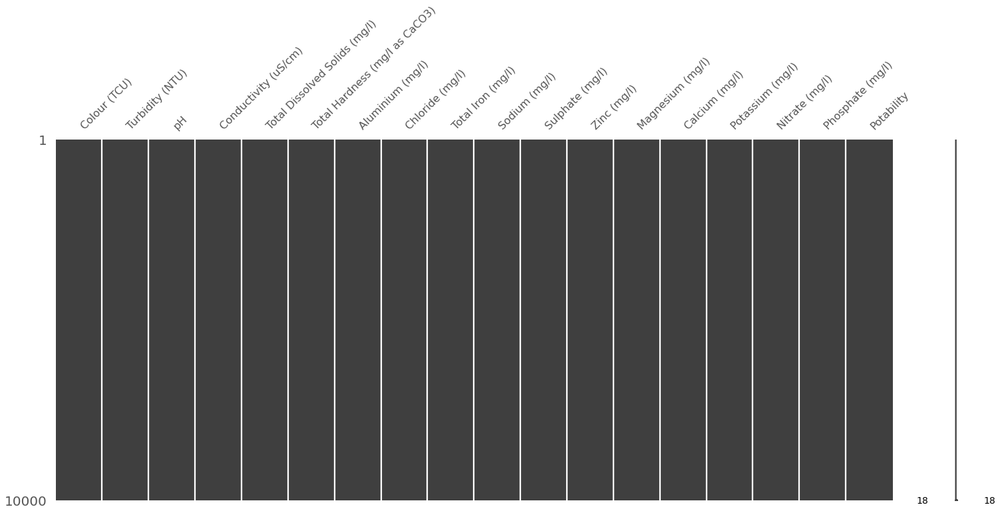

In [45]:
mno.matrix(df)
plt.show()

***There are no missing values in the dataset***

### 3.2) Check Duplicates

In [46]:
df.duplicated().sum()

0

***There are no duplicates values in the data set***

### 3.3) Check data types

In [47]:
# check null and Dtypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Colour (TCU)                    10000 non-null  float64
 1   Turbidity (NTU)                 10000 non-null  float64
 2   pH                              10000 non-null  float64
 3   Conductivity (uS/cm)            10000 non-null  float64
 4   Total Dissolved Solids (mg/l)   10000 non-null  float64
 5   Total Hardness (mg/l as CaCO3)  10000 non-null  float64
 6   Aluminium (mg/l)                10000 non-null  float64
 7   Chloride (mg/l)                 10000 non-null  float64
 8   Total Iron (mg/l)               10000 non-null  float64
 9   Sodium (mg/l)                   10000 non-null  float64
 10  Sulphate (mg/l)                 10000 non-null  float64
 11  Zinc (mg/l)                     10000 non-null  float64
 12  Magnesium (mg/l)                1

### 3.4) Checking the number of unique values of each column

In [48]:
df.nunique()

Colour (TCU)                      2907
Turbidity (NTU)                   1001
pH                                1375
Conductivity (uS/cm)              9824
Total Dissolved Solids (mg/l)     9745
Total Hardness (mg/l as CaCO3)    9218
Aluminium (mg/l)                    41
Chloride (mg/l)                   9049
Total Iron (mg/l)                   61
Sodium (mg/l)                     8811
Sulphate (mg/l)                   9386
Zinc (mg/l)                       1001
Magnesium (mg/l)                  7931
Calcium (mg/l)                    8488
Potassium (mg/l)                  6293
Nitrate (mg/l)                    6033
Phosphate (mg/l)                   441
Potability                           2
dtype: int64

#### Insights:
* Number of unique values are available in each column in our dataset

### 3.5) Check statistics of data set

In [49]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Colour (TCU),10000.0,15.006526,8.717615,0.01,7.5175,15.000,22.6600,30.00
Turbidity (NTU),10000.0,5.003388,2.906118,0.00,2.4900,5.000,7.5300,10.00
pH,10000.0,7.337763,3.101412,0.00,6.3975,7.470,8.4800,14.00
Conductivity (uS/cm),10000.0,1502.148272,869.812955,0.12,741.6350,1500.095,2259.7400,2999.91
Total Dissolved Solids (mg/l),10000.0,1001.183584,578.522848,0.05,494.5900,1000.030,1497.8800,1999.96
Total Hardness (mg/l as CaCO3),10000.0,300.613398,171.478482,0.03,154.9800,300.005,448.6050,599.97
Aluminium (mg/l),10000.0,0.200808,0.115359,0.00,0.1000,0.200,0.3000,0.40
Chloride (mg/l),10000.0,249.491721,144.526095,0.00,122.7075,249.915,374.7600,499.87
Total Iron (mg/l),10000.0,0.300165,0.174572,0.00,0.1500,0.300,0.4500,0.60
Sodium (mg/l),10000.0,200.793553,116.039382,0.01,99.8900,199.995,303.6450,399.98


#### Insight

* From above description of numerical data, all means are very close to each other - between 2.20 and 1502.14;
* All standard deviations are also close - between 1.27 and 869.81;
* While there is a minimum score 0 and maximum score 2999.91

### 3.6) Exploring Data

In [50]:
# Top 5 records
df.head()

,Colour (TCU),Turbidity (NTU),pH,Conductivity (uS/cm),Total Dissolved Solids (mg/l),Total Hardness (mg/l as CaCO3),Aluminium (mg/l),Chloride (mg/l),Total Iron (mg/l),Sodium (mg/l),Sulphate (mg/l),Zinc (mg/l),Magnesium (mg/l),Calcium (mg/l),Potassium (mg/l),Nitrate (mg/l),Phosphate (mg/l),Potability
0,8.34,3.39,8.06,819.00,787.15,279.89,0.09,129.30,0.22,13.13,81.01,2.24,12.69,107.95,17.50,22.23,0.41,potable
1,14.45,3.36,8.28,1371.10,779.66,112.04,0.20,163.73,0.13,127.48,307.99,4.05,52.01,107.12,45.28,16.06,0.68,potable
2,3.87,4.23,6.86,202.75,485.10,113.17,0.15,66.68,0.29,142.97,16.70,0.86,88.47,127.47,4.90,19.81,0.91,potable
3,14.57,1.75,7.00,696.16,409.71,140.39,0.06,102.42,0.15,194.07,393.09,2.60,61.36,99.16,36.73,42.82,0.02,potable
4,9.01,2.20,6.73,129.24,343.55,6.52,0.07,140.47,0.28,3.77,170.65,0.04,47.22,107.17,44.79,14.35,2.08,potable


### 3.7) Find unique values in a column

In [51]:
print("Categories in 'potability' variable: ",end=" " )
print(df['Potability'].unique())

Categories in 'potability' variable:  ['potable' 'non-potable']


#### insights: 
* Two unique value in Potability column: ['potable' 'non-potable']

### 3.8) Define numerical and categorical columns in our dataset

In [52]:
# define numerical & categorical columns
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features :   {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features :   {}'.format(len(categorical_features), categorical_features))

We have 17 numerical features :   ['Colour (TCU)', 'Turbidity (NTU)', 'pH', 'Conductivity (uS/cm)', 'Total Dissolved Solids (mg/l)', 'Total Hardness (mg/l as CaCO3)', 'Aluminium (mg/l)', 'Chloride (mg/l)', 'Total Iron (mg/l)', 'Sodium (mg/l)', 'Sulphate (mg/l)', 'Zinc (mg/l)', 'Magnesium (mg/l)', 'Calcium (mg/l)', 'Potassium (mg/l)', 'Nitrate (mg/l)', 'Phosphate (mg/l)']

We have 1 categorical features :   ['Potability']


#### Insights:
* 17 columns are numerical
* 01 column is categorical

### 3.9) Distribution of the Potability column

In [53]:
df['Potability'].value_counts()

potable        5000
non-potable    5000
Name: Potability, dtype: int64

#### Insights:
* potable and non-potable have equal values

### 3.10) column names in the dataset

In [54]:
df.columns

Index(['Colour (TCU)', 'Turbidity (NTU)', 'pH', 'Conductivity (uS/cm)',
       'Total Dissolved Solids (mg/l)', 'Total Hardness (mg/l as CaCO3)',
       'Aluminium (mg/l)', 'Chloride (mg/l)', 'Total Iron (mg/l)',
       'Sodium (mg/l)', 'Sulphate (mg/l)', 'Zinc (mg/l)', 'Magnesium (mg/l)',
       'Calcium (mg/l)', 'Potassium (mg/l)', 'Nitrate (mg/l)',
       'Phosphate (mg/l)', 'Potability'],
      dtype='object')

### 3.11) Extract Good_minerals and Bad_minerals in the dataset

In [55]:
# Extract columns based on two categories
extracted_columns = df[['Colour (TCU)', 'Turbidity (NTU)', 'pH', 'Conductivity (uS/cm)',
       'Total Dissolved Solids (mg/l)', 'Total Hardness (mg/l as CaCO3)',
       'Aluminium (mg/l)', 'Chloride (mg/l)', 'Total Iron (mg/l)',
       'Sodium (mg/l)', 'Sulphate (mg/l)', 'Zinc (mg/l)', 'Magnesium (mg/l)',
       'Calcium (mg/l)', 'Potassium (mg/l)', 'Nitrate (mg/l)',
       'Phosphate (mg/l)', 'Potability']] 

# Access the extracted columns
Good_minerals = extracted_columns.loc[:, ['Calcium (mg/l)', 'Potassium (mg/l)', 'Magnesium (mg/l)','Nitrate (mg/l)', 'Phosphate (mg/l)']].sort_values(["Calcium (mg/l)"], ascending=[True])
Bad_minerals = extracted_columns.loc[:, ["Colour (TCU)","Turbidity (NTU)","pH","Conductivity (uS/cm)","Total Dissolved Solids (mg/l)","Total Hardness (mg/l as CaCO3)","Aluminium (mg/l)","Chloride (mg/l)","Total Iron (mg/l)","Sodium (mg/l)","Sulphate (mg/l)","Zinc (mg/l)"]].sort_values([ 'Sodium (mg/l)'], ascending=[True])

# print the output
print(Good_minerals)
print("---------------------------------------------------------------------------------")
print(Bad_minerals)

      Calcium (mg/l)  Potassium (mg/l)  Magnesium (mg/l)  Nitrate (mg/l)  \
4898            0.02             42.34             67.74            6.40   
584             0.04              3.82             65.77           28.17   
3140            0.05             30.00             66.19           36.41   
975             0.06              0.21             79.85           26.43   
3150            0.10             43.94             61.23            2.41   
...              ...               ...               ...             ...   
8990          299.79             73.76            105.76           77.71   
8782          299.82             98.51            180.39           65.37   
6681          299.84             96.32            167.07           54.92   
6799          299.94             90.36            133.27           84.75   
9581          299.97             64.13            118.18           51.10   

      Phosphate (mg/l)  
4898              1.92  
584               1.49  
3140        

## Good minerals range in water
* *Calcium (mg/l) quantity is 0.02(min) to 299.97(max)*
* *Potassium (mg/l) quantity is 0.00(min) to 100.00(max)*
* *Nitrate (mg/l) (mg/l) quantity is 0.30(min) to 10.00(max)*
* *Magnesium (mg/l) quantity is 0.030(min) to 199.98(max)*
* *Phosphate (mg/l) quantity is 0.00(min) to 199.98(max)*

## Bad minerals range in water
* *Aluminium  (mg/l) quantity is 0.00(min) to 0.400(max)*
* *Chloride  (mg/l) quantity is 0.00(min) to 499.87(max)*
* *Total Iron (mg/l) quantity is 0.00(min) to 0.600(max)*
* *Sodium (mg/l) quantity is 0.010(min) to 399.98(max)*
* *Sulphate (mg/l) quantity is 0.030(min) to 799.88(max)*
* *Colour (TCU) quantity is 0.010(min) to 30.00(max)*
* *Turbidity (NTU) quantity is 0.00(min) to 10.00(max)*
* *pH quantity is 0.00(min) to 14.0(max)*
* *Conductivity (uS/cm) quantity is 0.120(min) to 2999.910(max)*
* *Total Dissolved Solids (mg/l) quantity is 0.050(min) to 1999.960(max)*
* *Zinc (mg/l) quantity is 0.00(min) to 10.00(max)*
* *Total Hardness (mg/l as CaCO3) quantity is 0.030(min) to 599.970(max)*

### 3.12) creating a random training set

In [56]:
df = df.sample(frac = 1)
df

,Colour (TCU),Turbidity (NTU),pH,Conductivity (uS/cm),Total Dissolved Solids (mg/l),Total Hardness (mg/l as CaCO3),Aluminium (mg/l),Chloride (mg/l),Total Iron (mg/l),Sodium (mg/l),Sulphate (mg/l),Zinc (mg/l),Magnesium (mg/l),Calcium (mg/l),Potassium (mg/l),Nitrate (mg/l),Phosphate (mg/l),Potability
8876,25.37,5.63,5.76,2665.22,1342.64,588.22,0.25,482.37,0.52,399.39,627.68,9.15,129.88,172.50,92.39,80.92,3.54,non-potable
4402,6.23,3.61,8.44,1188.58,378.65,289.42,0.17,10.56,0.17,5.87,178.18,0.32,11.14,86.50,49.14,43.67,0.16,potable
1313,13.74,1.62,6.97,1203.90,234.73,21.31,0.00,224.99,0.02,144.18,63.68,3.28,80.03,77.67,49.20,26.02,1.06,potable
5675,29.08,9.17,9.94,2409.00,1710.57,464.74,0.39,407.80,0.37,395.68,546.58,6.98,185.28,288.35,92.28,48.11,3.13,non-potable
9598,16.46,9.25,0.22,2615.52,1286.23,571.19,0.34,416.81,0.52,282.49,573.63,6.27,119.60,204.46,60.27,77.52,2.52,non-potable
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2396,7.06,2.55,6.85,1375.69,174.85,37.50,0.15,167.30,0.21,186.35,95.40,2.20,12.27,132.26,33.98,25.93,0.41,potable
9438,21.48,5.94,9.35,2708.90,1741.40,486.57,0.29,495.68,0.56,394.81,769.01,6.81,101.82,198.17,55.81,57.36,2.73,non-potable
7095,20.52,6.67,10.36,1593.65,1717.25,439.18,0.39,407.97,0.40,261.25,693.07,9.84,159.74,181.76,91.01,72.29,4.05,non-potable
6541,29.86,9.45,6.12,1547.47,1962.60,352.98,0.23,384.38,0.52,214.20,405.68,7.44,135.68,240.34,86.01,54.26,3.88,non-potable


### 3.13) Reset the index and drop index column

In [57]:
df = df.reset_index()
df = df.drop(columns=['index'])
df

,Colour (TCU),Turbidity (NTU),pH,Conductivity (uS/cm),Total Dissolved Solids (mg/l),Total Hardness (mg/l as CaCO3),Aluminium (mg/l),Chloride (mg/l),Total Iron (mg/l),Sodium (mg/l),Sulphate (mg/l),Zinc (mg/l),Magnesium (mg/l),Calcium (mg/l),Potassium (mg/l),Nitrate (mg/l),Phosphate (mg/l),Potability
0,25.37,5.63,5.76,2665.22,1342.64,588.22,0.25,482.37,0.52,399.39,627.68,9.15,129.88,172.50,92.39,80.92,3.54,non-potable
1,6.23,3.61,8.44,1188.58,378.65,289.42,0.17,10.56,0.17,5.87,178.18,0.32,11.14,86.50,49.14,43.67,0.16,potable
2,13.74,1.62,6.97,1203.90,234.73,21.31,0.00,224.99,0.02,144.18,63.68,3.28,80.03,77.67,49.20,26.02,1.06,potable
3,29.08,9.17,9.94,2409.00,1710.57,464.74,0.39,407.80,0.37,395.68,546.58,6.98,185.28,288.35,92.28,48.11,3.13,non-potable
4,16.46,9.25,0.22,2615.52,1286.23,571.19,0.34,416.81,0.52,282.49,573.63,6.27,119.60,204.46,60.27,77.52,2.52,non-potable
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,7.06,2.55,6.85,1375.69,174.85,37.50,0.15,167.30,0.21,186.35,95.40,2.20,12.27,132.26,33.98,25.93,0.41,potable
9996,21.48,5.94,9.35,2708.90,1741.40,486.57,0.29,495.68,0.56,394.81,769.01,6.81,101.82,198.17,55.81,57.36,2.73,non-potable
9997,20.52,6.67,10.36,1593.65,1717.25,439.18,0.39,407.97,0.40,261.25,693.07,9.84,159.74,181.76,91.01,72.29,4.05,non-potable
9998,29.86,9.45,6.12,1547.47,1962.60,352.98,0.23,384.38,0.52,214.20,405.68,7.44,135.68,240.34,86.01,54.26,3.88,non-potable


In [58]:
def detect_outliers(dataset, columns):
    df = dataset.copy()
    df[columns] = stats.zscore(df[columns])
    outliers = df[(df[columns] < -3) | (df[columns] > 3)]
    print(f"The number of outliers: {outliers.shape[0]}")
    df = df[(df[columns] > -3) & (df[columns] < 3)].reset_index(drop=True)
    return df

In [59]:
detect_outliers(df,'pH')

The number of outliers: 0


,Colour (TCU),Turbidity (NTU),pH,Conductivity (uS/cm),Total Dissolved Solids (mg/l),Total Hardness (mg/l as CaCO3),Aluminium (mg/l),Chloride (mg/l),Total Iron (mg/l),Sodium (mg/l),Sulphate (mg/l),Zinc (mg/l),Magnesium (mg/l),Calcium (mg/l),Potassium (mg/l),Nitrate (mg/l),Phosphate (mg/l),Potability
0,25.37,5.63,-0.508750,2665.22,1342.64,588.22,0.25,482.37,0.52,399.39,627.68,9.15,129.88,172.50,92.39,80.92,3.54,non-potable
1,6.23,3.61,0.355416,1188.58,378.65,289.42,0.17,10.56,0.17,5.87,178.18,0.32,11.14,86.50,49.14,43.67,0.16,potable
2,13.74,1.62,-0.118585,1203.90,234.73,21.31,0.00,224.99,0.02,144.18,63.68,3.28,80.03,77.67,49.20,26.02,1.06,potable
3,29.08,9.17,0.839091,2409.00,1710.57,464.74,0.39,407.80,0.37,395.68,546.58,6.98,185.28,288.35,92.28,48.11,3.13,non-potable
4,16.46,9.25,-2.295122,2615.52,1286.23,571.19,0.34,416.81,0.52,282.49,573.63,6.27,119.60,204.46,60.27,77.52,2.52,non-potable
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,7.06,2.55,-0.157279,1375.69,174.85,37.50,0.15,167.30,0.21,186.35,95.40,2.20,12.27,132.26,33.98,25.93,0.41,potable
9996,21.48,5.94,0.648846,2708.90,1741.40,486.57,0.29,495.68,0.56,394.81,769.01,6.81,101.82,198.17,55.81,57.36,2.73,non-potable
9997,20.52,6.67,0.974520,1593.65,1717.25,439.18,0.39,407.97,0.40,261.25,693.07,9.84,159.74,181.76,91.01,72.29,4.05,non-potable
9998,29.86,9.45,-0.392668,1547.47,1962.60,352.98,0.23,384.38,0.52,214.20,405.68,7.44,135.68,240.34,86.01,54.26,3.88,non-potable


## 4.) Exploring Data ( Visualization )
### 4.1 Visualize pH distribution to make some conclusion.

* Histogram
* Kernel Distribution Function (KDE)



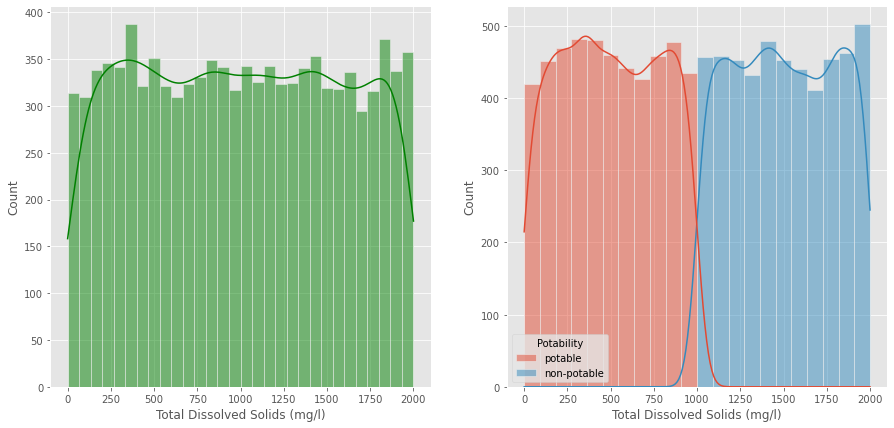

In [19]:
fig, axs = plt.subplots(1, 2, figsize=(15, 7))
plt.subplot(121)
sns.histplot(data=df,x='Total Dissolved Solids (mg/l)',bins=30,kde=True,color='g')
plt.subplot(122)
sns.histplot(data=df,x='Total Dissolved Solids (mg/l)',kde=True,hue='Potability')
plt.show()

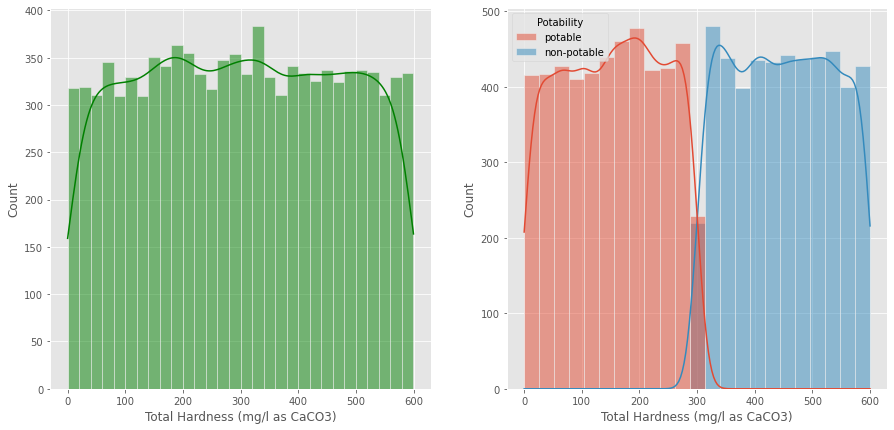

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(15, 7))
plt.subplot(121)
sns.histplot(data=df, x='Total Hardness (mg/l as CaCO3)',bins=30, kde=True, color='g')
plt.subplot(122)
sns.histplot(data=df, x='Total Hardness (mg/l as CaCO3)',kde=True, hue='Potability')
plt.show()

#### Insight: 
* <span style="color:darkblue">non-potable is high in `"Total Dissolved Solids (mg/l)"`</span>
* <span style="color:darkred">non-potable is high in `"Total Hardness (mg/l as CaCO3)"` </span>

### 4.2) Point plot show Chloride (mg/l) with Potability

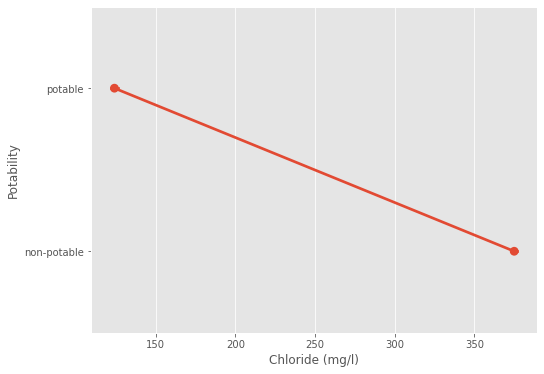

In [21]:
plt.figure(figsize=(8,6))
sns.pointplot(x='Chloride (mg/l)', y='Potability', data=df)
plt.show()

#### Insight: 
* `Chloride (mg/l)` is low then it's potable 
* `Chloride (mg/l)` is high than it's non-potable 

###### Note
*Chloride - can cause dehydration and high blood pressure*

### 4.3) Pair Plot with two good minerals

<Figure size 576x432 with 0 Axes>

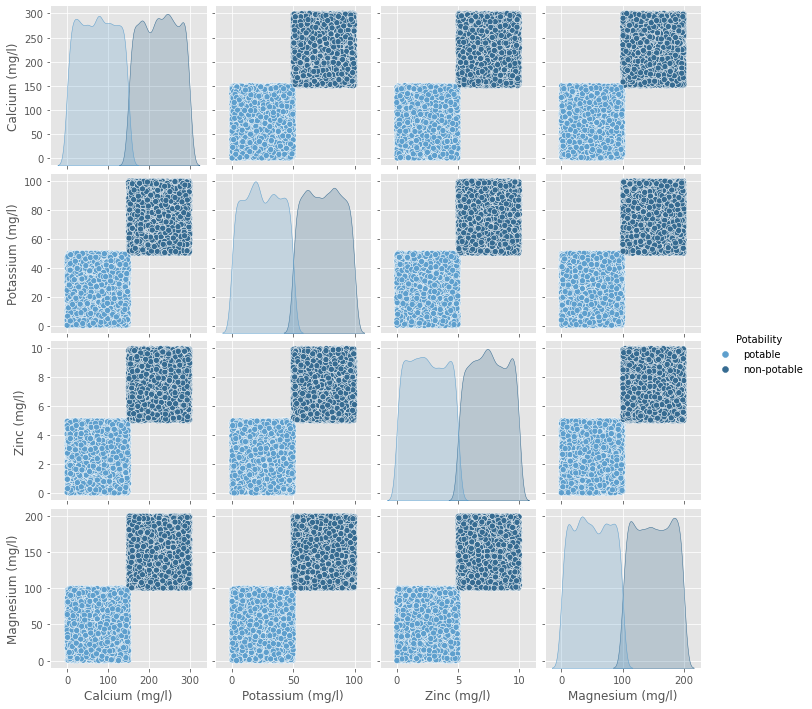

In [22]:
plt.figure(figsize=(8,6))
sns.pairplot(df, vars= ['Calcium (mg/l)', 'Potassium (mg/l)', 'Zinc (mg/l)', 'Magnesium (mg/l)'] , hue='Potability', palette='Blues_d')
plt.show()

### 4.4) Pair Plot with two bad minerals

<Figure size 576x432 with 0 Axes>

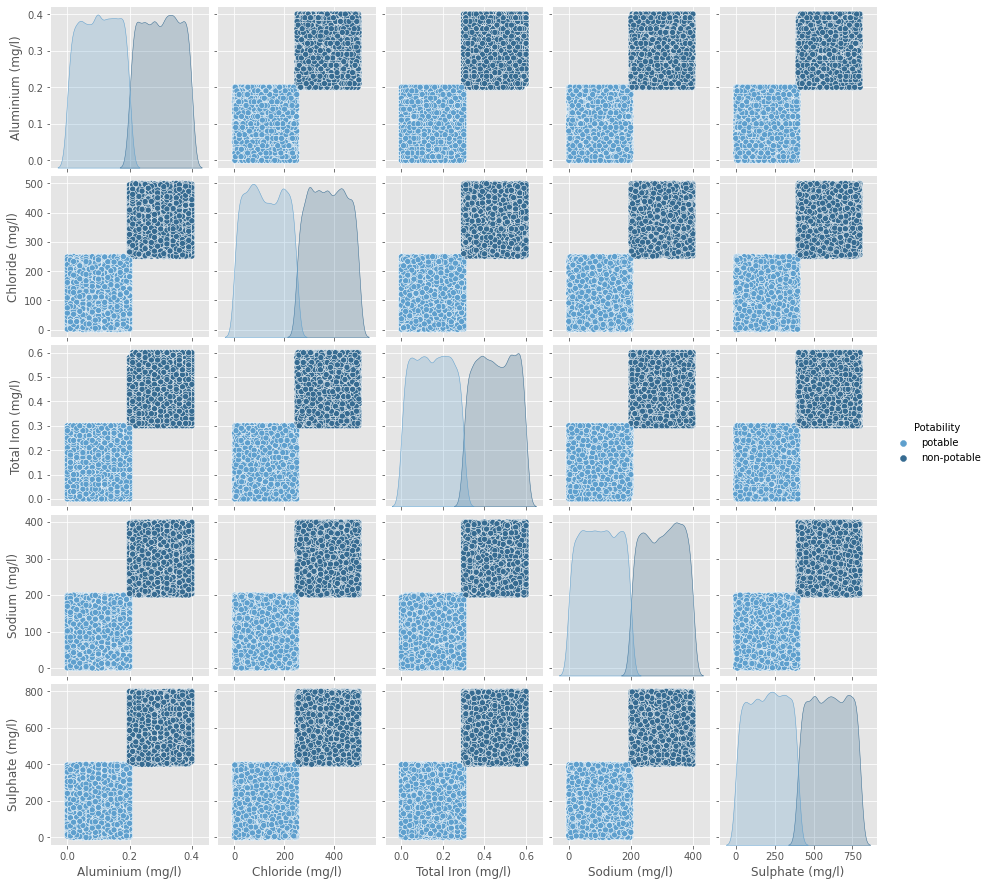

In [23]:
plt.figure(figsize=(8,6))
sns.pairplot(df, vars= ['Aluminium (mg/l)', 'Chloride (mg/l)', 'Total Iron (mg/l)', 'Sodium (mg/l)', 'Sulphate (mg/l)'] , hue='Potability' , palette='Blues_d')
plt.show()

### 4.5) Bar Plot

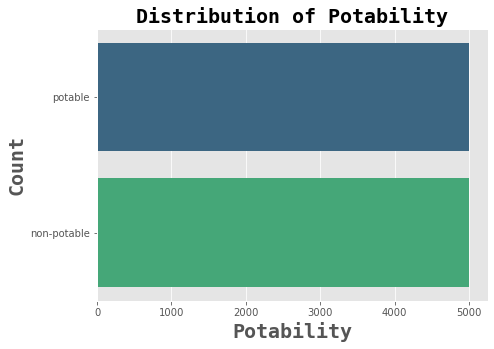

In [24]:
Potability = df['Potability'].value_counts()
plt.figure(figsize=(7,5))
sns.barplot(Potability.values, Potability.index, palette='viridis')
plt.title('Distribution of Potability', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.xlabel('Potability', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.ylabel('Count', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.tick_params(labelsize=10)
plt.show()

#### Insights:
* Distribution of Potability is equal in both potable and non-potable 

## 4.6) Correlation Matrix

In [37]:
df.corr()

,Colour (TCU),Turbidity (NTU),pH,Conductivity (uS/cm),Total Dissolved Solids (mg/l),Total Hardness (mg/l as CaCO3),Aluminium (mg/l),Chloride (mg/l),Total Iron (mg/l),Sodium (mg/l),Sulphate (mg/l),Zinc (mg/l),Magnesium (mg/l),Calcium (mg/l),Potassium (mg/l),Nitrate (mg/l),Phosphate (mg/l)
Colour (TCU),1.000000,0.754021,-0.043882,0.753990,0.748718,0.745498,0.750874,0.747499,0.756394,0.751185,0.750063,0.752901,0.750764,0.753162,0.754484,0.755246,0.755006
Turbidity (NTU),0.754021,1.000000,-0.039172,0.752617,0.755528,0.749558,0.748596,0.754928,0.749736,0.753077,0.751699,0.753478,0.751698,0.756980,0.748636,0.753121,0.752187
pH,-0.043882,-0.039172,1.000000,-0.042363,-0.044006,-0.044394,-0.051973,-0.048232,-0.051106,-0.045605,-0.041821,-0.042260,-0.049970,-0.041775,-0.044744,-0.045593,-0.043168
Conductivity (uS/cm),0.753990,0.752617,-0.042363,1.000000,0.748699,0.747672,0.744483,0.749396,0.754554,0.751929,0.753221,0.750440,0.749118,0.752775,0.749214,0.751324,0.747222
Total Dissolved Solids (mg/l),0.748718,0.755528,-0.044006,0.748699,1.000000,0.745505,0.752255,0.754592,0.752543,0.750340,0.748560,0.750242,0.751867,0.750462,0.750698,0.743644,0.746325
Total Hardness (mg/l as CaCO3),0.745498,0.749558,-0.044394,0.747672,0.745505,1.000000,0.746234,0.751529,0.748817,0.748920,0.743679,0.751788,0.748201,0.747218,0.747368,0.742780,0.750667
Aluminium (mg/l),0.750874,0.748596,-0.051973,0.744483,0.752255,0.746234,1.000000,0.751024,0.746312,0.748090,0.745120,0.748384,0.750620,0.747276,0.747976,0.747962,0.747161
Chloride (mg/l),0.747499,0.754928,-0.048232,0.749396,0.754592,0.751529,0.751024,1.000000,0.758243,0.752279,0.750914,0.757840,0.754775,0.754510,0.752729,0.747878,0.752192
Total Iron (mg/l),0.756394,0.749736,-0.051106,0.754554,0.752543,0.748817,0.746312,0.758243,1.000000,0.754617,0.752593,0.751597,0.751144,0.755845,0.752737,0.747048,0.753177
Sodium (mg/l),0.751185,0.753077,-0.045605,0.751929,0.750340,0.748920,0.748090,0.752279,0.754617,1.000000,0.749473,0.751137,0.747790,0.753694,0.747828,0.748987,0.754418


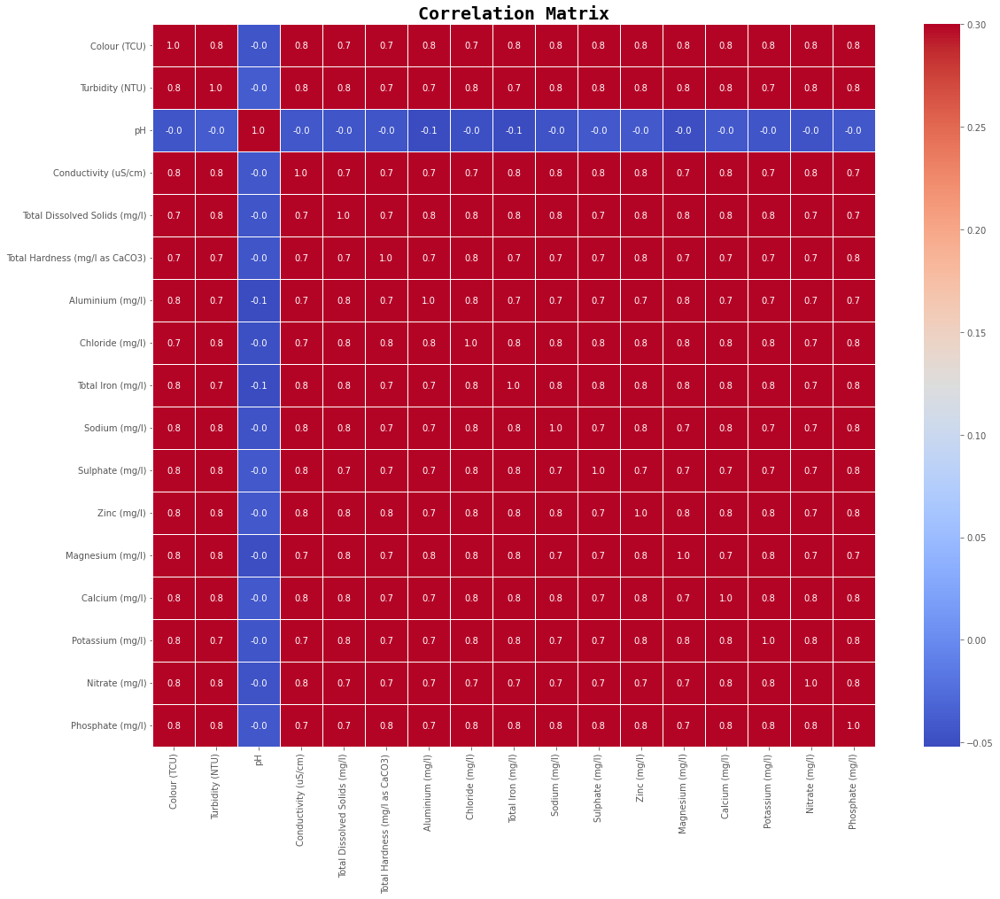

In [25]:
# Heatmap with correlation matrix
corr = df.corr()
f,ax = plt.subplots(figsize=(20,15))
sns.heatmap(corr, cbar = True, square = True, annot = True, fmt= '.1f', 
            xticklabels= True, yticklabels= True, vmax=0.3,
            cmap="coolwarm", linewidths=.5, ax=ax)
plt.title('Correlation Matrix', fontdict={'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.show()

#### Insight;
* The variables with the strongest correlation are conductivity and turbidity, with a correlation coefficient of 0.7.
* The variables with the weakest correlation are conductivity and temperature, with a correlation coefficient of 0.2.


### 4.7) Dis plot with Good_minerals

In [26]:
cols = []
for g_col in Good_minerals.columns:
    if df[g_col].dtype == float:
        cols.append(g_col)
        
cols

['Calcium (mg/l)',
 'Potassium (mg/l)',
 'Magnesium (mg/l)',
 'Nitrate (mg/l)',
 'Phosphate (mg/l)']

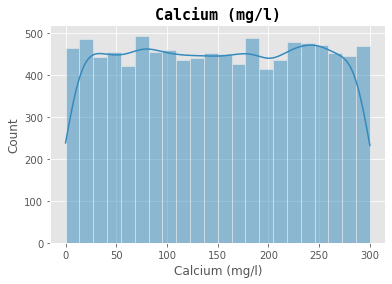

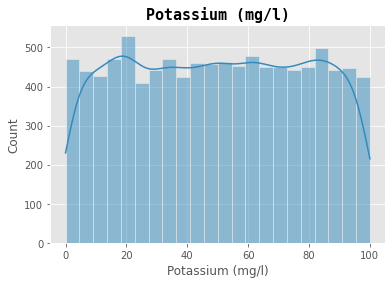

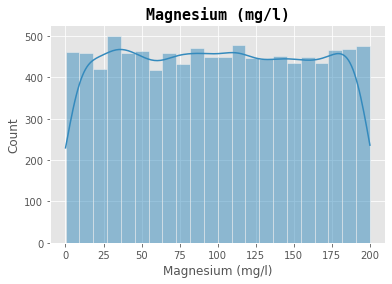

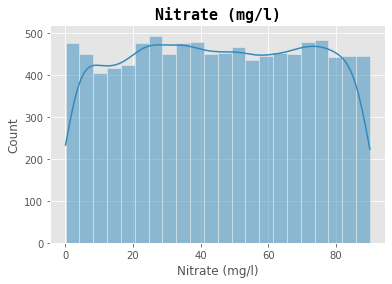

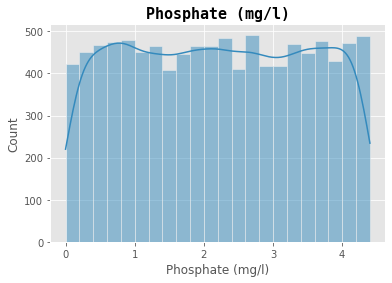

In [27]:
for g_col in cols:
    plt.figure()
    sns.histplot(data=df, x=g_col, kde=True)
    plt.title(g_col, fontdict={'fontname': 'Monospace', 'fontsize': 15, 'fontweight': 'bold'})
    plt.show()

#### Insights: 
* `'Potassium (mg/l)'` are more than 500 (mg/l) in the water
* `'Magnesium (mg/l)'` and `'Nitrate (mg/l)'` is appoox of 500 (mg/l) in the water
* `'Calcium (mg/l)'` and `'Phosphate (mg/l)'` is low of 500 (mg/l) in the water

### 4.8) Dist plot with Bad_minerals

In [28]:
cols = []
for b_col in Bad_minerals.columns:
    if df[b_col].dtype == float:
        cols.append(b_col)
        
cols

['Colour (TCU)',
 'Turbidity (NTU)',
 'pH',
 'Conductivity (uS/cm)',
 'Total Dissolved Solids (mg/l)',
 'Total Hardness (mg/l as CaCO3)',
 'Aluminium (mg/l)',
 'Chloride (mg/l)',
 'Total Iron (mg/l)',
 'Sodium (mg/l)',
 'Sulphate (mg/l)',
 'Zinc (mg/l)']

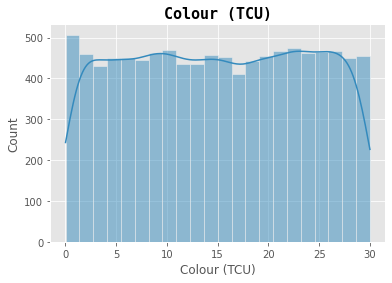

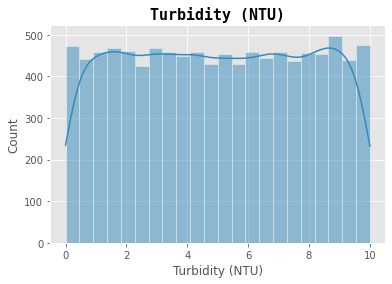

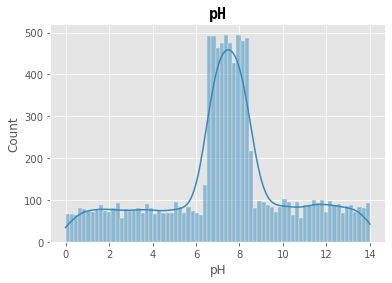

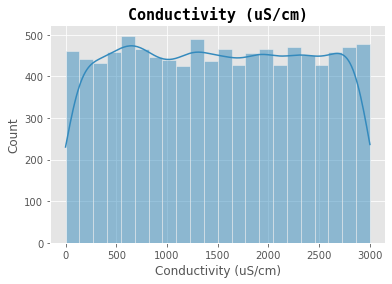

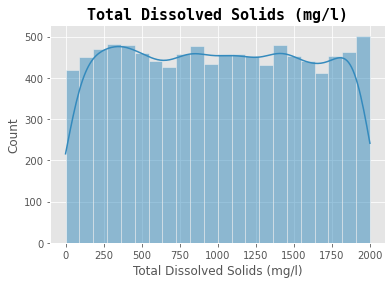

...

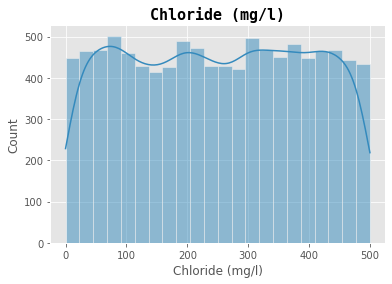

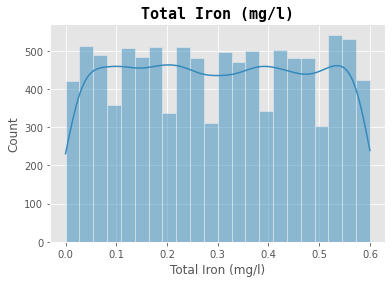

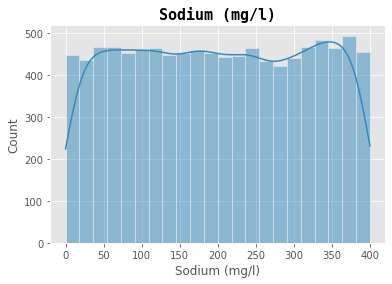

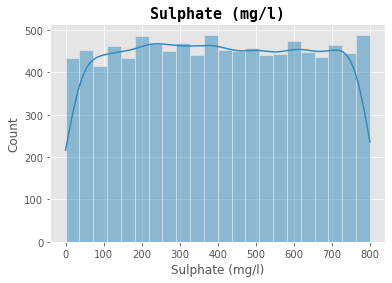

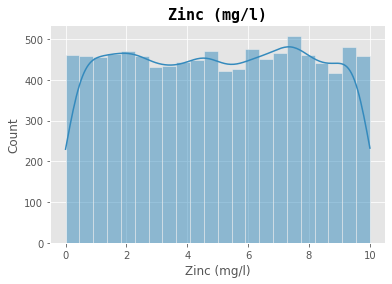

In [29]:
for b_col in cols:
    plt.figure()
    sns.histplot(data=df, x=b_col, kde=True)
    plt.title(b_col, fontdict={'fontname': 'Monospace', 'fontsize': 15, 'fontweight': 'bold'})
    plt.show()

#### Insights:
* `'Total Iron'`, `'Chloride'`, `'Zinc (mg/l)`, `'Color (TCU)` and `'Aluminium'` are more than 500 (mg/l) in the water.
* `'Sodium'`, `'Turbidity (NTU)'`, `'pH'`, `'Conductivity (uS/cm)'`, `'Total Hardness'`, `'Sodium'`, `'Total Dissolved Solids (mg/l)'` and `'Sulphate'` are also almost or less than 500 (mg/l) in the water (Bad_minerals).

### 4.9) histogram plots with pH and Potability

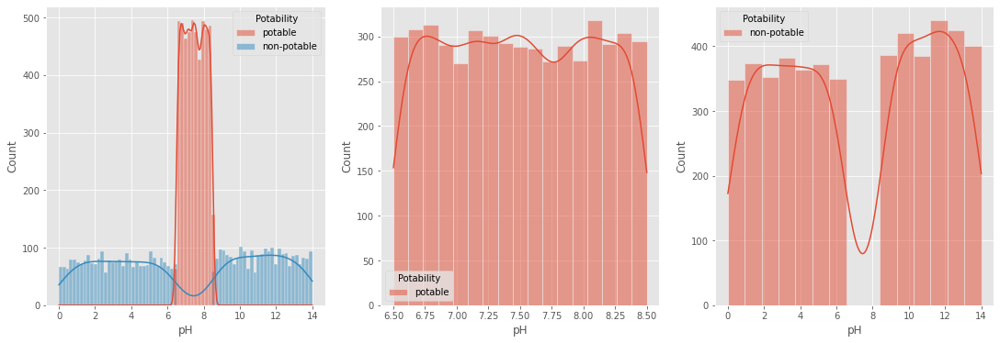

In [30]:
plt.subplots(1,3,figsize=(25,6))
plt.subplot(141)
ax =sns.histplot(data=df, x='pH', kde=True, hue='Potability')
plt.subplot(142)
ax =sns.histplot(data=df[df.Potability=='potable'], x='pH', kde=True, hue='Potability')
plt.subplot(143)
ax =sns.histplot(data=df[df.Potability=='non-potable'], x='pH', kde=True, hue='Potability')
plt.show()


#### Insights:
* pH is almost 7 in our column so it's potable for us.

### 4.10) Violin Plot with some columns

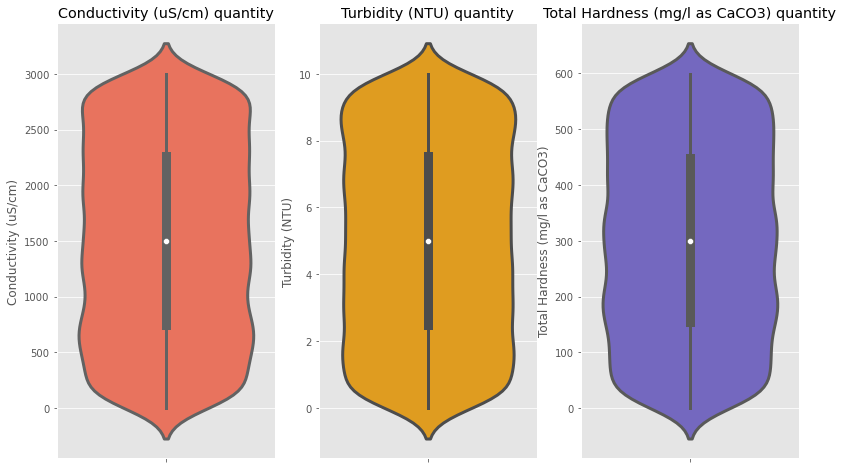

In [31]:
plt.figure(figsize=(18,8))
plt.subplot(1, 4, 1)
plt.title('Conductivity (uS/cm) quantity')
sns.violinplot(y='Conductivity (uS/cm)',data=df, color='tomato', linewidth=3)
plt.subplot(1, 4, 2)
plt.title('Turbidity (NTU) quantity')
sns.violinplot(y='Turbidity (NTU)',data=df, color='orange', linewidth=3)
plt.subplot(1, 4, 3)
plt.title('Total Hardness (mg/l as CaCO3) quantity')
sns.violinplot(y='Total Hardness (mg/l as CaCO3)',data=df, color='slateblue', linewidth=3)
plt.show()

#### Insights:
* From the above three plots its clearly visible that most of the water components in between 1000-2000 in Conductivity (uS/cm) whereas in Turbidity (NTU) most of them score from 4-6 and in Total Hardness (mg/l as CaCO3) most of them score from 200-400.
* The distribution of conductivity is bimodal, with two peaks. This suggests that there are two distinct types of water samples.
* The distribution of turbidity is unimodal, with a single peak. This suggests that the water samples are relatively homogeneous in terms of turbidity.

###  4.11) CHECKING OUTLIERS

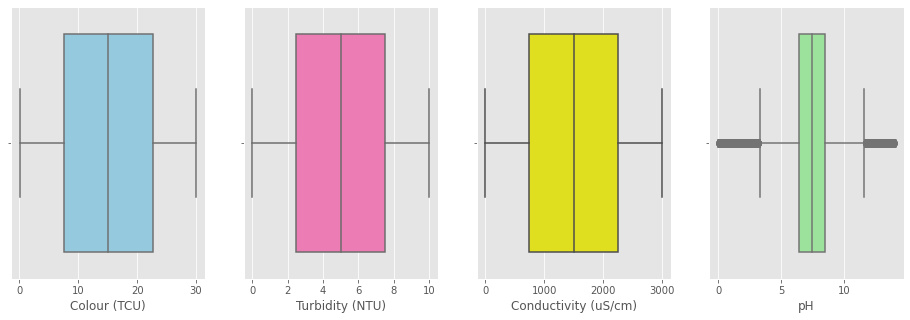

In [32]:
plt.subplots(1,4,figsize=(16,5))
plt.subplot(141)
sns.boxplot(df['Colour (TCU)'], color='skyblue')
plt.subplot(142)
sns.boxplot(df['Turbidity (NTU)'], color='hotpink')
plt.subplot(143)
sns.boxplot(df['Conductivity (uS/cm)'], color='yellow')
plt.subplot(144)
sns.boxplot(df['pH'],color='lightgreen')
plt.show()


#### Insights:
* There are `no outliers` in the data. This suggests that the data is relatively homogeneous.
* The median `turbidity` is 1000 NTU, and the median conductivity is 200 cm. Water samples are relatively clear and have a moderate conductivity.

### 4.12) Multivariate analysis using pieplot

(-1.25, 1.25, -1.25, 1.25)

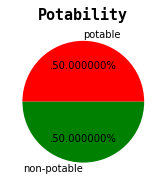

In [33]:
plt.subplot(1,2,1)
size = df['Potability'].value_counts()
labels = 'potable', 'non-potable'
color = ['red','green']

plt.pie(size, colors = color,labels = labels, autopct = '.%2f%%')
plt.title('Potability', fontdict={'fontname': 'Monospace', 'fontsize': 15, 'fontweight': 'bold'})
plt.axis('off')


#### Insight:
* potable and non-potable is equal in Potability  

### 4.13) UNIVARIATE ANALYSIS ( Which type of Potability is most common amoung Turbidity (NTU) ? )

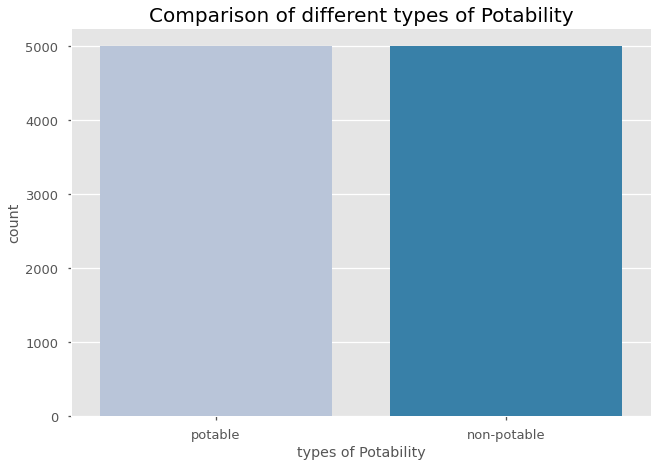

In [34]:
plt.rcParams['figure.figsize'] = (15, 9)
plt.style.use('seaborn-talk')
sns.countplot(df['Potability'], palette = 'PuBu')
plt.title('Comparison of different types of Potability', fontweight = 30, fontsize = 20)
plt.xlabel('types of Potability')
plt.ylabel('count')
plt.show()

#### Insight:
* potable and non-potable is same 

### 4.14) MUTIVARIATE ANALYSIS USING PAIRPLOT 

<Figure size 1440x1080 with 0 Axes>

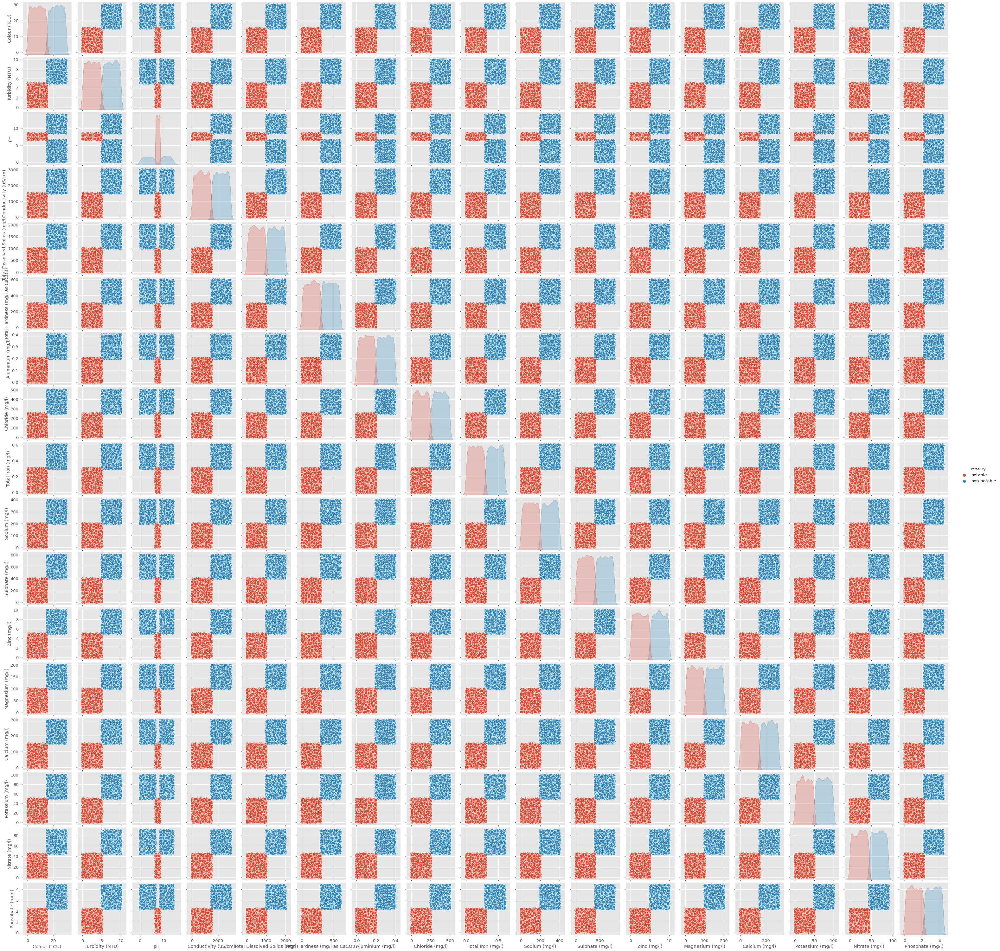

In [35]:
plt.figure(figsize=(20,15))
sns.pairplot(df, hue = 'Potability')
plt.show()

#### Insight:
* There is a strong positive correlation between the height and weight of the students.
* There is a weak negative correlation between the height and age of the students.


### 5. Conclusions

*    Water quality prediction is related with Potability, Good_minerals, Bad_minerals.
*    Good minerals are is less and Bad minerals are more in the water. 
*    We need to check minerals of water which we can filter for potable. i.e. pH, Hardness, Chloride etc.
*    Finishing water quality is benefitial.
